#Group 12B
Usha pavani Thopalle - 989466020</br>
Purwa Mugdiya - 989468918</br>
Sahana Nagaraj Reddy - 989466865


##Project Name : **Impact of Layoff on Employee Attrition**

**Subtitle :**
*Analysing and Exploring variations in Employee exit from Companies.*
</br>
</br>
##**<u>1.Objective</u> :-**

The intent of the research is to understand and identify employee's voluntary or involuntary exit from their company, based on their Age, Job Satisfaction, Gender, Salary, Performance, experience, their skills, level of employee satisfaction, and several other factors that can impact the organization structure. In this study, we explored the layoff procedures and the reasons for employee attrition by analyzing the various factors in the dataset. The findings may also aid in reducing skilled employee’s voluntary attrition from downsizing organizations by clarifying how layoff procedures affect employee organizational commitment and identify possible counter measures.

This study is conducted using various quantitative and qualitative methods and algorithms to create models which categorizes and provides the expected results and used to assess employee attrition based on the set of qualities in the data collection. Therefore, the proposed model is helpful in predicting employee attrition.

Several issues develop after layoffs, Layoffs can reduce the cost of doing business but may not produce desired results if not executed properly.

The purpose of this study is to explore and understand the reason that could lower employee organizational commitment and identify processes that might reduce employee voluntary attrition post layoff procedures based on the chosen dataset.


<u>**Stakeholder**</u>:

The project's stakeholders include all the required MNCs, including Twitter, Apple, Google, Meta, and Amazon. The results of this study might contribute to positive social change and could help higher managements and employers to better understand and minimize the negative effects of the layoffs that have on the existing employees. This awareness might lead Board members to take some necessary actions and create the environment that reduces employee attrition from downsizing organizations.

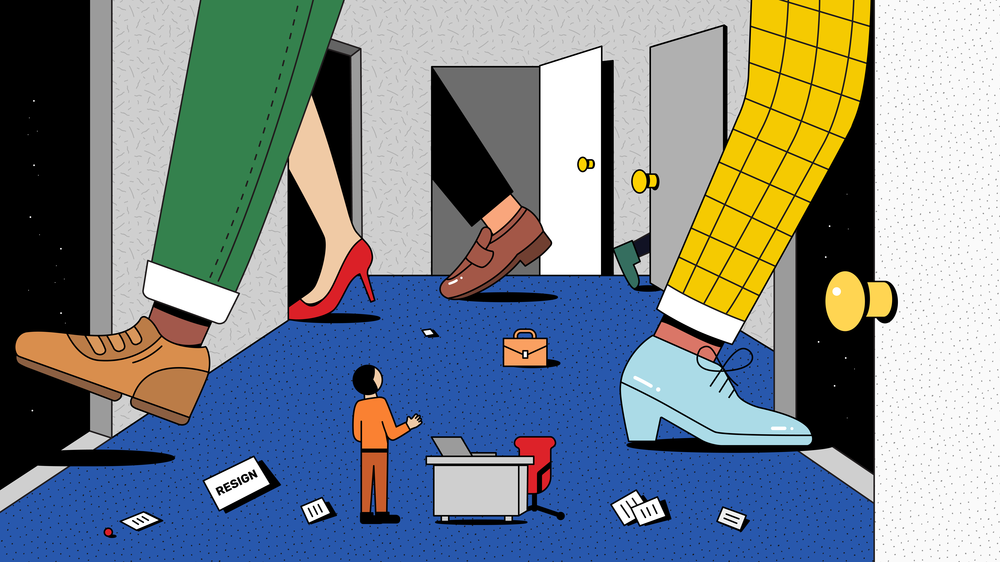

In [ ]:
#Installing packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from matplotlib.colors import ListedColormap
from sklearn import datasets
from sklearn.cluster import KMeans
import sklearn.metrics as sm
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.metrics.pairwise import euclidean_distances
from sklearn.metrics import silhouette_score

In [ ]:
#Read and import the csv file and store the data in a variable
Emp_layoff = pd.read_csv("/content/Employee_Attritions_Rate.csv")
Emp_layoff.head(2)

,Emp_ID,Emp_Age,Emp_Gender,Education_Level,Education_Field,Dist_from_home,Company_name,Location_HQ,Industry,Country,...,Years_At_Company,Years_In_Current_Role,Years_Since_Last_Promotion,Years_With_Curr_Manager,Work_Life_Balance,Business_Travel,Laid_Off_Count,Laid_Off_Percentage,Laid_Off_Date,Laid_off_Month_Year
0,1,41,Female,2,Life Sciences,1,Splunk,SF Bay Area,Data,United States,...,6,4,0,5,1,Travel_Rarely,325,4%,2/1/23,23-Feb
1,2,49,Male,1,Life Sciences,8,DraftKings,Boston,Consumer,United States,...,10,7,1,7,3,Travel_Frequently,140,4%,2/1/23,23-Feb


##**<u>2.Data Exploration</u> :-**

In this section, we have analysed the dataset, where we found the size, quantity, dimensions, type, accuracy of the data and performed cleaning of the data in order to better understand the nature of the data.

1. Fetched the dimensions of the data to understand the number of rows and columns present in the dataset.
2. Fetched the summary and type of the data for each column in the dataset.
3. Checked if there are any missing values in the dataset, where we did not find any missing data.
4. Checked for the duplicate data if any, where we found no duplicate data in this dataset as before and after removing the duplicates the dimensions are same i.e.(1470, 28)
5. Calculated the percentiles, min, max,mean, median and standard deviation of all the numeric feaatures in the dataset.
6. Sorted the data based on the laid off count, where we found the top 3 companies with the highest laid off count is "Google", "Meta" and "Microsoft".

In [ ]:
#Print the dimension of the data
Emp_layoff.shape

(1470, 29)

In [ ]:
#Display the datatypes of each column
Emp_layoff.dtypes

Emp_ID                         int64
Emp_Age                        int64
Emp_Gender                    object
Education_Level                int64
Education_Field               object
Dist_from_home                 int64
Company_name                  object
Location_HQ                   object
Industry                      object
Country                       object
Emp_Job_Role                  object
Emp_Job_Level                  int64
Emp_Job_Satisfaction           int64
Emp_Salary                     int64
Emp_Salary_Hike_Per            int64
Emp_Performance_Rating         int64
OverTime                      object
No_Companies_Worked            int64
Emp_Experience                 int64
Years_At_Company               int64
Years_In_Current_Role          int64
Years_Since_Last_Promotion     int64
Years_With_Curr_Manager        int64
Work_Life_Balance              int64
Business_Travel               object
Laid_Off_Count                 int64
Laid_Off_Percentage           object
L

In [ ]:
#Display the summary of the dataset
Emp_layoff.info

<bound method DataFrame.info of       Emp_ID  Emp_Age Emp_Gender  Education_Level Education_Field  \
0          1       41     Female                2   Life Sciences   
1          2       49       Male                1   Life Sciences   
2          4       37       Male                2           Other   
3          5       33     Female                4   Life Sciences   
4          7       27       Male                1         Medical   
...      ...      ...        ...              ...             ...   
1465    2061       36       Male                2         Medical   
1466    2062       39       Male                1         Medical   
1467    2064       27       Male                3   Life Sciences   
1468    2065       49       Male                3         Medical   
1469    2068       34       Male                3         Medical   

      Dist_from_home  Company_name    Location_HQ    Industry        Country  \
0                  1        Splunk    SF Bay Area        Da

In [ ]:
#Display the description of the dataset
Emp_layoff.describe()

,Emp_ID,Emp_Age,Education_Level,Dist_from_home,Emp_Job_Level,Emp_Job_Satisfaction,Emp_Salary,Emp_Salary_Hike_Per,Emp_Performance_Rating,No_Companies_Worked,Emp_Experience,Years_At_Company,Years_In_Current_Role,Years_Since_Last_Promotion,Years_With_Curr_Manager,Work_Life_Balance,Laid_Off_Count
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,1024.865306,36.923810,2.912925,9.192517,2.063946,2.728571,6502.931293,15.209524,3.153741,2.693197,11.279592,7.008163,4.229252,2.187755,4.123129,2.761224,300.399320
std,602.024335,9.135373,1.024165,8.106864,1.106940,1.102846,4707.956783,3.659938,0.360824,2.498009,7.780782,6.126525,3.623137,3.222430,3.568136,0.706476,1011.148935
min,1.000000,18.000000,1.000000,1.000000,1.000000,1.000000,1009.000000,11.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,3.000000
25%,491.250000,30.000000,2.000000,2.000000,1.000000,2.000000,2911.000000,12.000000,3.000000,1.000000,6.000000,3.000000,2.000000,0.000000,2.000000,2.000000,40.000000
50%,1020.500000,36.000000,3.000000,7.000000,2.000000,3.000000,4919.000000,14.000000,3.000000,2.000000,10.000000,5.000000,3.000000,1.000000,3.000000,3.000000,84.000000
75%,1555.750000,43.000000,4.000000,14.000000,3.000000,4.000000,8379.000000,18.000000,3.000000,4.000000,15.000000,9.000000,7.000000,3.000000,7.000000,3.000000,190.000000
max,2068.000000,60.000000,5.000000,29.000000,5.000000,4.000000,19999.000000,25.000000,4.000000,9.000000,40.000000,40.000000,18.000000,15.000000,17.000000,4.000000,12000.000000


In [ ]:
#Sort data based on Laid off count
sorted_df = Emp_layoff.sort_values(by='Laid_Off_Count', ascending=False)
top_30 = sorted_df.head(30)
top_5 = np.unique(sorted_df['Company_name'].head(5))
top_5

array(['Google', 'Meta', 'Microsoft'], dtype=object)

In [ ]:
#Number of Null data in each feature
Null_data = Emp_layoff.isnull().sum()
Null_data

Emp_ID                        0
Emp_Age                       0
Emp_Gender                    0
Education_Level               0
Education_Field               0
Dist_from_home                0
Company_name                  0
Location_HQ                   0
Industry                      0
Country                       0
Emp_Job_Role                  0
Emp_Job_Level                 0
Emp_Job_Satisfaction          0
Emp_Salary                    0
Emp_Salary_Hike_Per           0
Emp_Performance_Rating        0
OverTime                      0
No_Companies_Worked           0
Emp_Experience                0
Years_At_Company              0
Years_In_Current_Role         0
Years_Since_Last_Promotion    0
Years_With_Curr_Manager       0
Work_Life_Balance             0
Business_Travel               0
Laid_Off_Count                0
Laid_Off_Percentage           0
Laid_Off_Date                 0
Laid_off_Month_Year           0
dtype: int64

##**<u>3.Data Cleaning</u> :-**

After exploring the data, we were quite sure that the data which we have received is very much clean and hence cleaning is not required for this dataset. However, we have performed some data cleaning just to be 100% sure that we have all the relevant data.

1. Checked for the missing values if any, where we did not find any missing data.
2. Eliminated the features from the dataset which are not of much help in the research. (for example - Laid_off_Month_Year, as it does not contain relevant and has same data throughout the dataset.)
3.  Checked for the duplicate data if any, where we found no duplicate data in this dataset as before and after removing the duplicates the dimensions are same i.e.(1470, 28)

In [ ]:
#Check for null values
Emp_layoff.isnull().head(2)

,Emp_ID,Emp_Age,Emp_Gender,Education_Level,Education_Field,Dist_from_home,Company_name,Location_HQ,Industry,Country,...,Years_At_Company,Years_In_Current_Role,Years_Since_Last_Promotion,Years_With_Curr_Manager,Work_Life_Balance,Business_Travel,Laid_Off_Count,Laid_Off_Percentage,Laid_Off_Date,Laid_off_Month_Year
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [ ]:
#Drop Column Laid_off_Month_Year
Emp_layoff.drop('Laid_off_Month_Year', axis=1,inplace = True)
Emp_layoff.shape

(1470, 28)

In [ ]:
#Drop duplicates
Emp_layoff.drop_duplicates(inplace = True)
Emp_layoff.shape

(1470, 28)

In [ ]:
#Drop Null values
Emp_layoff.dropna(inplace = True)
Emp_layoff.shape

(1470, 28)

##**<u>4.Data Adaptation</u> :-**

In this part, we have created and added 3 new columns to the existing dataset which will be required in further findings of the research.

1. Average Salary - This column is created to understand the average salary of the employee based on their Job role.
2. Promotion_Status - This is the classification column whose value will be in the form of "Yes" or "No", it is created based on the Employee performance and their Job level.
3. Increased_Salary - This will give the glimse of the increased salary of the employee after their hike. It is calculated based on the current salary of the employee and percentage of teh hike they have received.

In [ ]:
average_salary = Emp_layoff.groupby('Emp_Job_Role')['Emp_Salary'].mean()
Emp_layoff['average_salary'] = Emp_layoff['Emp_Job_Role'].map(average_salary)

In [ ]:
Emp_layoff['promotion_status'] = (Emp_layoff['Emp_Performance_Rating'] == 4) & (Emp_layoff['Emp_Job_Level'] >= 3)
Emp_layoff['promotion_status'] = Emp_layoff['promotion_status'].map({True: 'Yes', False: 'No'})

In [ ]:
Emp_layoff['increased_salary'] = ((Emp_layoff['Emp_Salary_Hike_Per']/100)* Emp_layoff['Emp_Salary'] )+ Emp_layoff['Emp_Salary']

In [ ]:
Emp_layoff_Adapt = Emp_layoff[['Emp_ID','Company_name','average_salary','promotion_status','increased_salary']]
Emp_layoff_Adapt.head(2)

,Emp_ID,Company_name,average_salary,promotion_status,increased_salary
0,1,Splunk,6924.279141,No,6652.23
1,2,DraftKings,3239.972603,No,6309.90


##**<u>5.Data Visualization</u> :-**

In this section, we are representing our data graphically which gave us a good understanding of the data and also helped us to understand the correlation between the features.
This a straightforward way to provide a clear, intuitive and graphical representation of majority of the columns in the dataset.



*  **Scatter Plot** -

      This graph shows the companies and their lay off count, where in x axis consists of the company name and Y axis has the lay off count.
      by looking at this plot, it is clearly seen that Company "Google" had the highest lay off count.





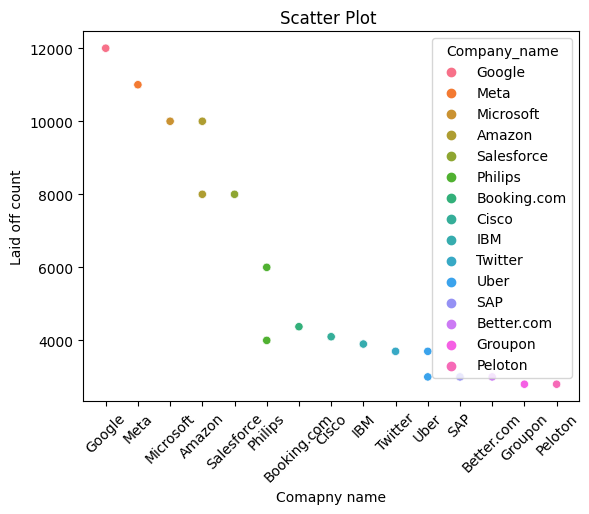

In [ ]:
sns.scatterplot(data=top_30, x='Company_name', y='Laid_Off_Count', hue='Company_name')
plt.xticks(rotation=45)
plt.title('Scatter Plot ')
plt.xlabel('Comapny name')
plt.ylabel('Laid off count')
plt.show()

* **Correlation Graph** -

This graph demonstrates the relation between each feature with every other feature in the dataset, where value 1 means features are highly correlated with each other and 0 means no correlation.



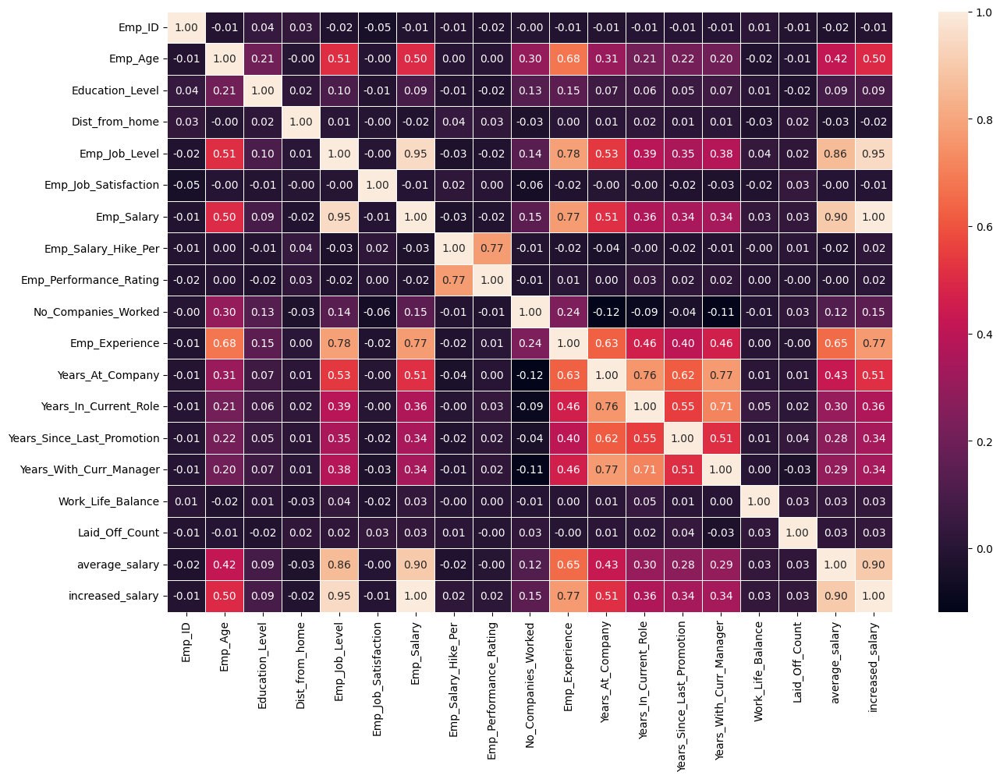

In [ ]:
# Let's make our correlation matrix visual
corr_matrix=Emp_layoff.corr(numeric_only=True)
fig,ax=plt.subplots(figsize=(15,10))
ax=sns.heatmap(corr_matrix,
               annot=True,
               linewidths=0.5,
               fmt=".2f"
              )

* **Pair Plot** -

This plot displays the pairwise relationship between few of the selected features which is Employee Age, Employee Salary, Education level, Performance rating, Employee hike Percentage.

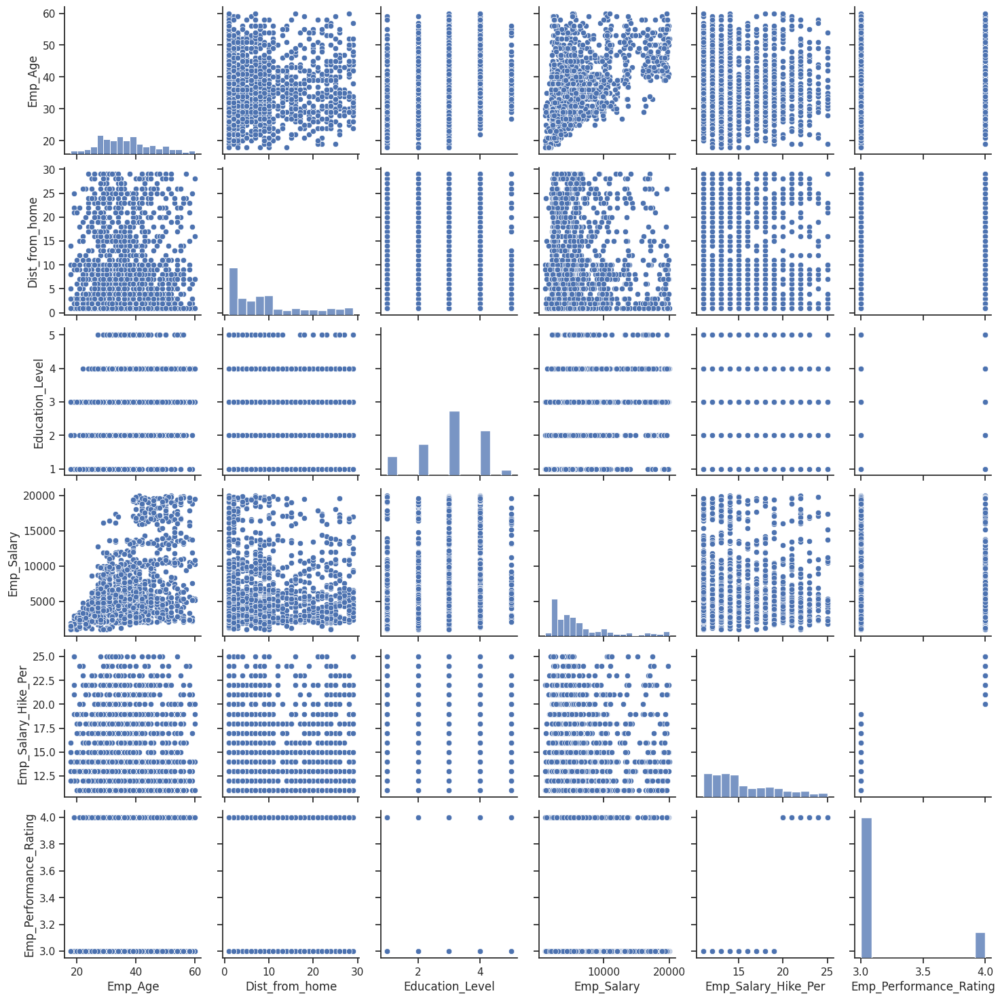

In [ ]:
selected_columns = Emp_layoff[['Emp_Age', 'Dist_from_home', 'Education_Level','Emp_Salary', 'Emp_Salary_Hike_Per', 'Emp_Performance_Rating']]

# Create a pairs plot without coloring by a specific column
sns.set(style="ticks")
colors = ["red", "green", "blue"]
sns.pairplot(selected_columns, markers="o")
sns.set_palette(colors)
# Show the plot
plt.show()

* **Joint Plot** -

This graph provides a concise explanation of the Age-based Employee Overtime.

It is evident from this plot that most of the overtime work is performed by individuals between the ages of 30 and 40.




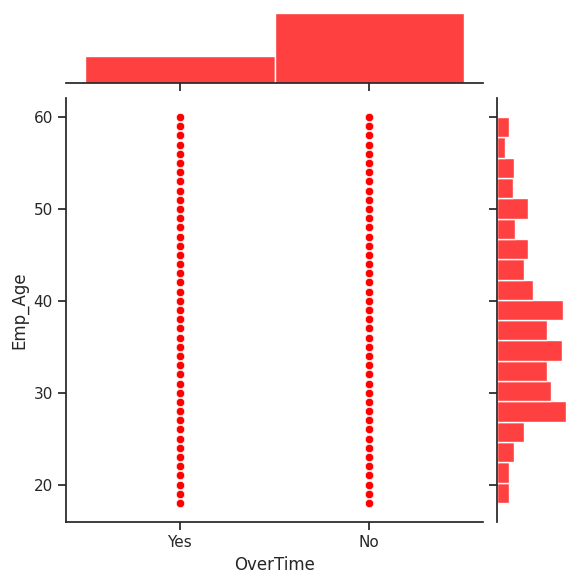

In [ ]:
sns.jointplot(x='OverTime',y='Emp_Age',data=Emp_layoff)

* **Box Plot** -

This box plot for the gender-based employee experience is the type of graph that is typically used to identify outliers.

Based on their experience, it is obvious that female employees have a higher percentage of outliers than male employees.

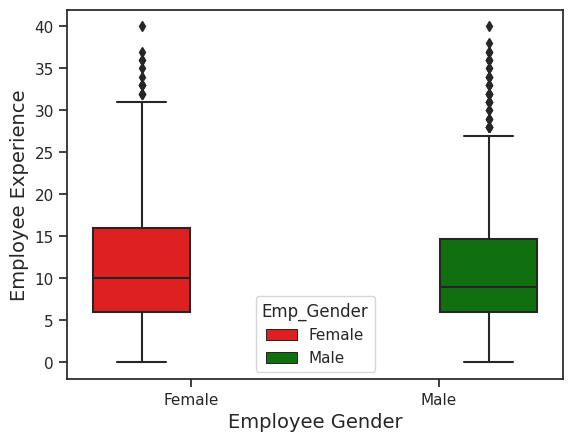

In [ ]:
p = sns.boxplot(data=Emp_layoff, x="Emp_Gender", y="Emp_Experience", hue="Emp_Gender")
p.set_xlabel("Employee Gender", fontsize=14)
p.set_ylabel("Employee Experience", fontsize=14)
plt.show()

*  **Joint Plot** -

This graph provides a concise explanation of the Experience-based Employee Overtime.

It is evident from this plot that most of the overtime work is performed by individuals with minimum or no experience.

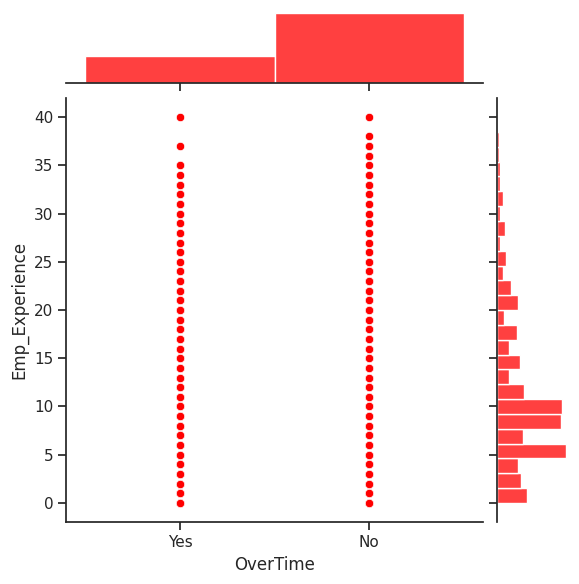

In [ ]:
sns.jointplot(x='OverTime',y='Emp_Experience',data=Emp_layoff)

* **3D scatterplot with a fitted plane** -

This graph gives the understanding of the relationship between three variables: 'Job_Level,' 'Job_Satisfaction,' and 'Salary'.

The fitted plane represents the linear regression model's prediction of 'Salary' based on the other two variables.

With this plot, it is clear that the higher the employee's Job level and Job Satisfaction, the higher the Salary of the employee.



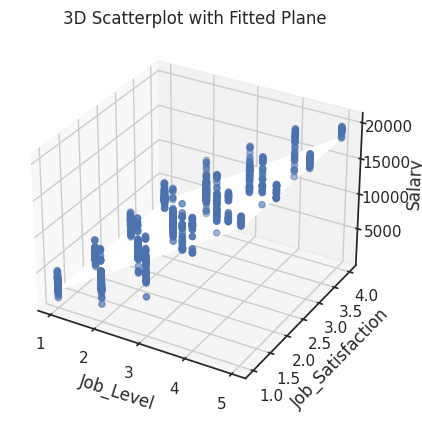

In [ ]:
Job_Level = Emp_layoff["Emp_Job_Level"]
Job_Satisfaction = Emp_layoff["Emp_Job_Satisfaction"]
Salary = Emp_layoff["Emp_Salary"]
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(Job_Level, Job_Satisfaction, Salary, c='b', marker='o', label='Data points')

# Fit a plane (linear regression) to the data
A = np.column_stack((Job_Level, Job_Satisfaction, np.ones_like(Job_Level)))
solution = np.linalg.lstsq(A, Salary, rcond=None)
fit = solution[0]

xx, yy = np.meshgrid(np.linspace(min(Job_Level), max(Job_Level), 50), np.linspace(min(Job_Satisfaction), max(Job_Satisfaction), 50))
zz = fit[0] * xx + fit[1] * yy + fit[2]

# Plot the fitted plane
ax.plot_surface(xx, yy, zz, color='r', alpha=0.5, label='Fitted Plane')

# Set labels and title
ax.set_xlabel('Job_Level')
ax.set_ylabel('Job_Satisfaction')
ax.set_zlabel('Salary')
ax.set_title('3D Scatterplot with Fitted Plane')

plt.show()

##**<u>6.Cluster Analysis</u> :-**

* In this section, we are have grouped the employees into different clusters based on certain characteristics or pattern.

* This is to understand the diversity of the workforce in a company which is based on the employee's job role, performance, job level.

* Here, we have considered, Agglomerative hierarchical Clustering technique which is a Bottom up approach is used to group employees, and recognize trends, and tailor business strategies to reduce attrition, improve employee satisfaction, and enhance overall workforce performance.

* In this, each datapoint is considered to be one single member cluster.
* The clustering is performed based on three features i.e. Employees Age, Salary and Performance and by transforming the data into distance matrix which calculates the similarity between pairs of employees which is based on the mentioned attributes and employees with similarity are considered in one cluster.

* Euclidean Distance is calculated to check the distance between two clusters which is identified as this distance represents the dissimilarity between groups of employees which will be considered as two distinct clusters.

* It can be used to identify high-performing teams within the organization.
* It can help in segmenting employees for targeted training or development programs.
* It may assist in understanding patterns related to attrition and employee retention based on the Age and Experience.

* 3D Scatter Plot, displays the relationship between Employees age, Salary and their work life balance.


In [ ]:
emp2 = pd.DataFrame(Emp_layoff[['Laid_Off_Count']])

In [ ]:
emp_distance_df = pd.DataFrame(euclidean_distances(emp2))
#round(emp_distance_df, 2)
emp3 = emp_distance_df.astype(int)
emp3.head(2)

,0,1,2,3,4,5,6,7,8,9,...,1460,1461,1462,1463,1464,1465,1466,1467,1468,1469
0,0,185,269,281,301,1675,635,200,175,40,...,285,265,247,285,346,285,255,299,301,215
1,185,0,84,96,116,1860,820,385,360,225,...,100,80,62,100,531,100,70,114,116,30


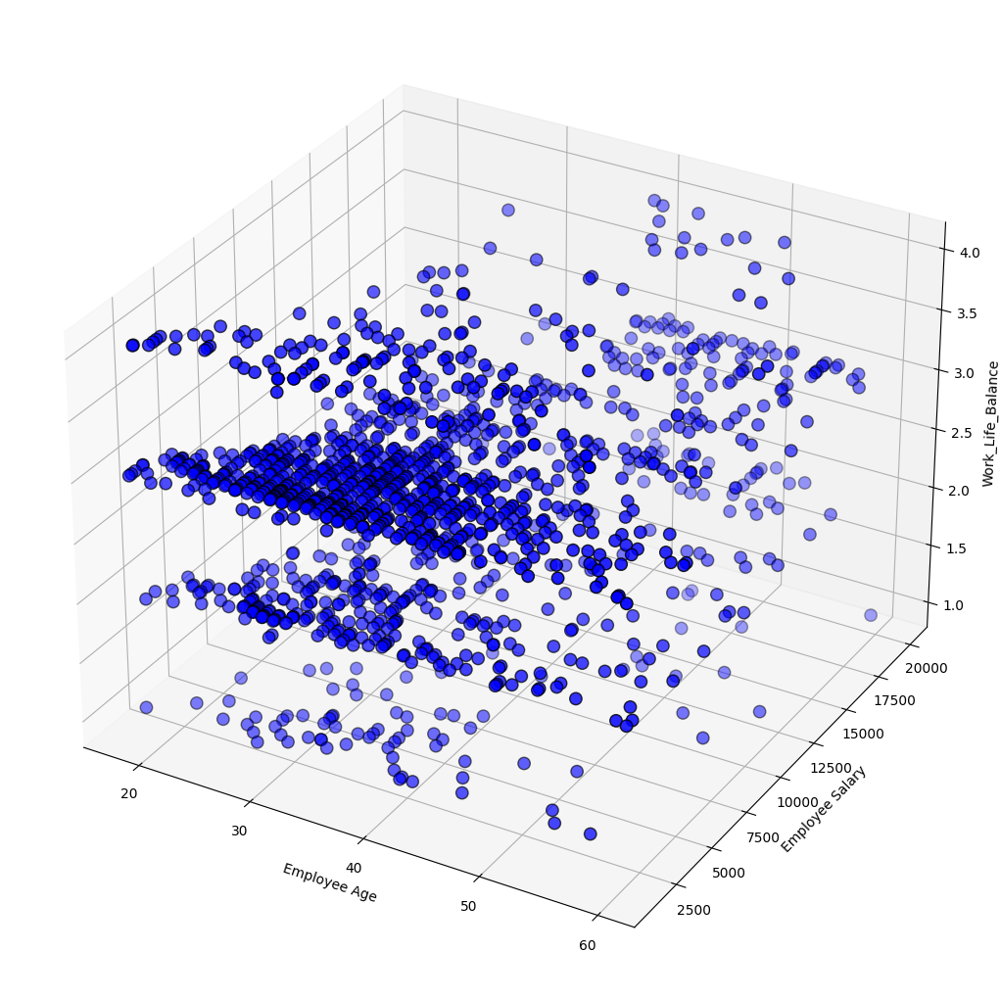

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(13, 13))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(xs=Emp_layoff['Emp_Age'], ys=Emp_layoff['Emp_Salary'], zs=Emp_layoff['Work_Life_Balance'], s=80, fc='blue', edgecolor='black', depthshade=True)

for age, salary, work, name in Emp_layoff[['Emp_Age', 'Emp_Salary', 'Work_Life_Balance']].itertuples(index=True, name=None):
    ax.text(age, salary, work, name)

ax.set_xlabel('Employee Age')
ax.set_ylabel('Employee Salary')
ax.set_zlabel('Work_Life_Balance')

plt.show()

In [ ]:
cluster_num = 3   #desired number of clusters

# Changing the DataFrame to a nested list for easier manipulation
dist_matrix = emp3.values.tolist()

# Creating the initial clusters, where each datapoint is a cluster
clusters = [[i] for i in range(len(dist_matrix))]

# Function to calculate the Euclidean distance between two clusters
def euclidean_dist(cluster1, cluster2):
    total_dist = 0
    for i in cluster1:
        for j in cluster2:
            total_dist += dist_matrix[i][j]
    return total_dist / (len(cluster1) * len(cluster2))

#Agglomerative clustering loop
while len(clusters) > cluster_num:
    min_dist = float('inf')
    to_merge = (0, 1)

    for i in range(len(clusters)):
        for j in range(i + 1, len(clusters)):
            dist = euclidean_dist(clusters[i], clusters[j])
            if dist < min_dist:
                min_dist = dist
                to_merge = (i, j)

    # Merging the two closest clusters
    clusters[to_merge[0]].extend(clusters[to_merge[1]])
    del clusters[to_merge[1]]

In [40]:
output_list = []
# iterating clusters in i and printing the clusters
for i, cluster in enumerate(clusters):
    output_list.append(f"Cluster {i + 1}: {cluster}")

last_10_lines = output_list[-7:]
for line in last_10_lines:
    print(line)

Cluster 1: [0, 1108, 29, 622, 1137, 95, 581, 703, 982, 1203, 129, 272, 273, 757, 767, 805, 1237, 1380, 1381, 1043, 56, 68, 204, 220, 247, 263, 298, 306, 506, 555, 561, 570, 666, 671, 698, 719, 773, 821, 854, 916, 1001, 1080, 1164, 1176, 1312, 1328, 1355, 1371, 1406, 1414, 103, 745, 1211, 164, 1272, 690, 9, 1117, 885, 786, 47, 1155, 331, 1439, 1091, 524, 146, 256, 305, 313, 433, 540, 658, 687, 776, 817, 869, 981, 1060, 1088, 1254, 1364, 1413, 1421, 1064, 884, 15, 30, 89, 156, 422, 445, 598, 612, 616, 630, 641, 655, 760, 892, 1051, 1062, 1065, 1074, 1123, 1138, 1197, 1264, 155, 1263, 35, 122, 1143, 1230, 237, 1345, 514, 667, 754, 1015, 166, 1274, 983, 941, 57, 106, 1165, 1214, 88, 434, 566, 693, 809, 1196, 165, 615, 706, 890, 1273, 507, 69, 1177, 26, 822, 1134, 423, 810, 446, 80, 789, 1188, 322, 1430, 70, 1178, 230, 1338, 303, 562, 1044, 1411, 108, 139, 205, 222, 231, 277, 307, 332, 351, 447, 490, 547, 623, 663, 691, 695, 707, 739, 935, 936, 937, 966, 1030, 1216, 1247, 1313, 1330, 1339, 

##**<u>7.Dendrogram</u> :-**

**Dendrogram**
* A dendrogram is created to visualize the hierarchical structure of the clusters.
* A dendrogram provides insights into the relationships between 'Emp_Age', 'Emp_Salary', 'Work_Life_Balance' and how they are grouped into clusters.


**Silhouette Score Plot**
* This plot helps determine the optimal number of clusters.
* The point where the Silhouette Score is highest suggests the best number of clusters for the data.

In [ ]:
cols_to_cluster = Emp_layoff[['Emp_Age', 'Emp_Salary', 'Emp_Performance_Rating']]

# Normalizing the data
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaled_data = scaler.fit_transform(cols_to_cluster)

# Performing hierarchical clustering
link_matrix = linkage(scaled_data, method='ward', metric='euclidean')
link_matrix

array([[4.78000000e+02, 9.34000000e+02, 0.00000000e+00, 2.00000000e+00],
       [1.12000000e+02, 1.00800000e+03, 0.00000000e+00, 2.00000000e+00],
       [1.26200000e+03, 1.29300000e+03, 2.12478652e-04, 2.00000000e+00],
       ...,
       [2.92900000e+03, 2.93500000e+03, 3.02909390e+01, 1.02100000e+03],
       [2.93200000e+03, 2.93600000e+03, 5.13078983e+01, 1.22600000e+03],
       [2.93400000e+03, 2.93700000e+03, 5.28184357e+01, 1.47000000e+03]])

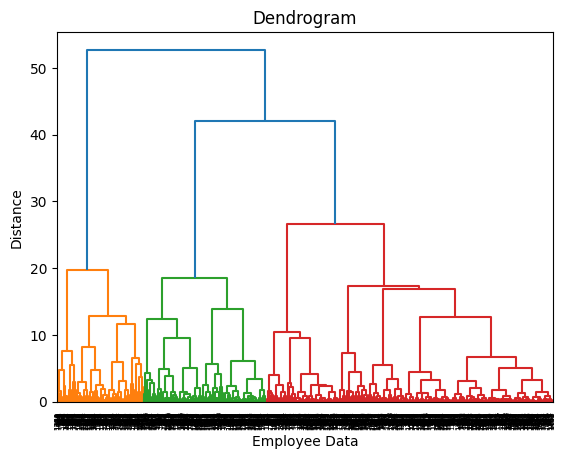

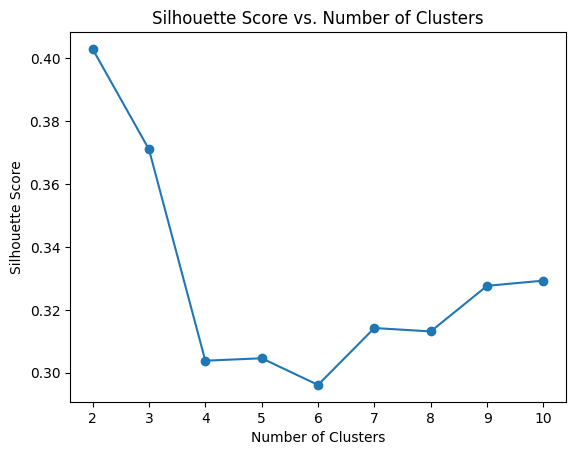

In [ ]:
cols = ['Emp_Age', 'Emp_Salary', 'Work_Life_Balance']

# Selecting the subset of the data for clustering
data = Emp_layoff[cols]

# Standardizing the data
scale_r = StandardScaler()
scaled_data = scale_r.fit_transform(data)

# Creating the linkage matrix using the 'ward' method
link_age_mat = linkage(scaled_data, method='ward')

# Calculate and plot the dendrogram
dendrogram(link_age_mat)
plt.xlabel('Employee Data')
plt.ylabel('Distance')
plt.title('Dendrogram')
plt.show()

# Determining silhouette score to determine the optimal number of clusters

silhouette_scores = []
for n_clusters in range(2, 11):
    c_labels = fcluster(link_age_mat, n_clusters, criterion='maxclust')
    silhouette_avg = silhouette_score(scaled_data, c_labels)
    silhouette_scores.append(silhouette_avg)

# Plotting the graph of the silhouette scores
plt.plot(range(2, 11), silhouette_scores, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score vs. Number of Clusters')
plt.show()

# Selecting the number of clusters based on silhouette scores
opti_no_clust = silhouette_scores.index(max(silhouette_scores)) + 2

# Performing clustering with the number of clusters
c_labels = fcluster(link_age_mat, opti_no_clust, criterion='maxclust')

# Assigning cluster labels
Emp_layoff['Cluster_Labels'] = c_labels #cluster labels

##**<u>8.Unsupervised Clustering (Step-by-step K-means)</u> :-**

This clustering uses the 'Laid_Off_Count' and 'increased_salary' features to standardize employee-related data for further analysis, which can be useful for making well-informed business decisions regarding staff layoffs and salary adjustments.

It ensures that these features are on a consistent scale, making them more suitable for use in various analytical models and helping businesses extract meaningful insights from their employee data.

Here, we've used two techniques for clustering:

1. By choosing random centroids
2. using the kmeans() approach

1. **K-means using random centroids** -

* After selecting the features for clustering, we have performed Feature scaling, which is a data preprocessing technique used to ensure that the features have similar scales or units of measurement. Because if the features are not scaled there's a possibility of getting a biased model.

In [ ]:
#Scale and print the scaled data
emp = pd.DataFrame(Emp_layoff[['Laid_Off_Count', 'increased_salary']])
scaler = StandardScaler()
Emp_scaled = pd.DataFrame(scaler.fit_transform(emp), columns=['Laid_Off_Count', 'increased_salary'])
Emp_scaled.head(2)

,Laid_Off_Count,increased_salary
0,0.024338,-0.154160
1,-0.158685,-0.217357


Text(0, 0.5, 'Employee Increased Salary')

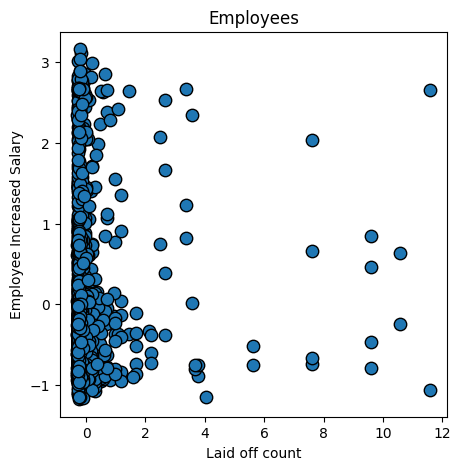

In [ ]:
#Plot the graph of the scaled data
fig = plt.figure(figsize=(5,5))
plt.scatter(Emp_scaled.Laid_Off_Count, Emp_scaled.increased_salary, edgecolor = 'black', s = 80)
plt.title('Employees')
plt.xlabel('Laid off count')
plt.ylabel('Employee Increased Salary')

* After scaling and ploting the scaled data, next we place the random centroids to for the clustering based on those centroids.
* Plot a graph after defining the centroids, just to have a visuals of the placing.

In [ ]:
centroid1 = np.array([2,0.62])
centroid2 = np.array([8, -1])
centroid3 = np.array([10, 1.5])
print(centroid1, centroid2, centroid3)
fig = plt.figure(figsize=(15,5))

[2.   0.62] [ 8 -1] [10.   1.5]


<Figure size 1500x500 with 0 Axes>

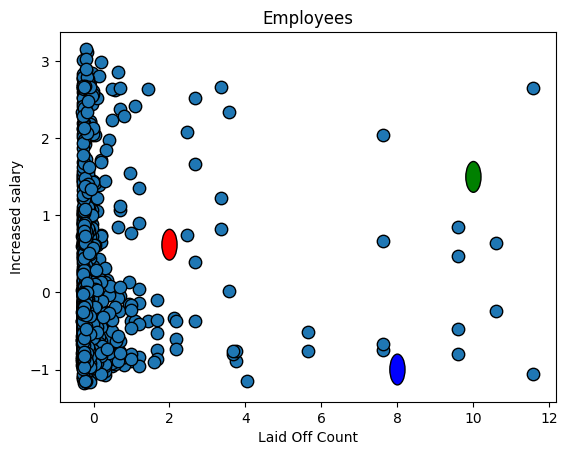

In [ ]:
plt.scatter(Emp_scaled.Laid_Off_Count, Emp_scaled.increased_salary, edgecolor = 'black', s = 80)
plt.title('Employees')
plt.xlabel('Laid Off Count')
plt.ylabel('Increased salary')
circle1 = plt.Circle(centroid1, radius=0.2, edgecolor = 'black', fc='red')
circle2 = plt.Circle(centroid2, radius=0.2, edgecolor = 'black', fc='blue')
circle3 = plt.Circle(centroid3, radius=0.2, edgecolor = 'black', fc='green')
plt.gca().add_patch(circle1)
plt.gca().add_patch(circle2)
plt.gca().add_patch(circle3)

* Cluster of the datapoints are identified by calculating the distance of the data points from the placed centroids and assign the datapoints to the closest centroid.

* Once the data points are associated to the respective cluster, plot the graph to have the visuals of these placings.

* Repeat the previous two steps until a stopping criterion is met such as reaching a certain number of iterations or the centroids staying the same.

In [ ]:
#Calculating the distance
Emp_scaled["Dist_C1"] = np.sqrt((Emp_scaled.Laid_Off_Count - centroid1[0])**2
                             + (Emp_scaled.increased_salary - centroid1[1])**2)
Emp_scaled["Dist_C2"] = np.sqrt((Emp_scaled.Laid_Off_Count - centroid2[0])**2 +
                             (Emp_scaled.increased_salary - centroid2[1])**2)
Emp_scaled["Dist_C3"] = np.sqrt((Emp_scaled.Laid_Off_Count - centroid3[0])**2 +
                             (Emp_scaled.increased_salary - centroid3[1])**2)
Emp_scaled.head(2)

,Laid_Off_Count,increased_salary,Dist_C1,Dist_C2,Dist_C3,Association
0,0.024338,-0.154160,0.188111,7.599417,10.178439,1
1,-0.158685,-0.217357,0.228002,7.780000,10.366522,1


In [ ]:
#Associating the data points to the closest cluster
Emp_scaled["Association"] = np.where(
    (Emp_scaled.Dist_C1 < Emp_scaled.Dist_C2) &
    (Emp_scaled.Dist_C1 < Emp_scaled.Dist_C3), 1,
     np.where((Emp_scaled.Dist_C2 < Emp_scaled.Dist_C1) &
    (Emp_scaled.Dist_C2 < Emp_scaled.Dist_C3) , 2, 3))
Emp_scaled.head(2)

,Laid_Off_Count,increased_salary,Dist_C1,Dist_C2,Dist_C3,Association
0,0.024338,-0.154160,0.188111,7.599417,10.178439,1
1,-0.158685,-0.217357,0.228002,7.780000,10.366522,1


Text(0, 0.5, 'Increased salary')

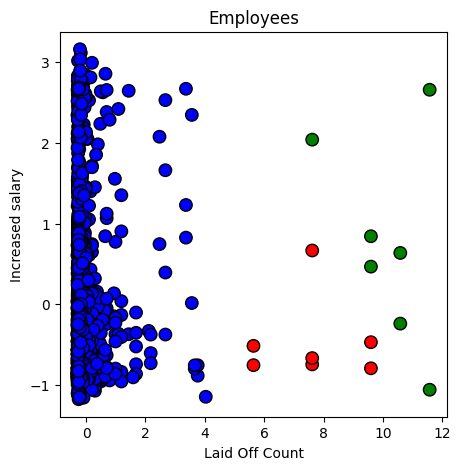

In [ ]:
fig = plt.figure(figsize=(5,5))

# Create a colormap
colormap = np.array(['black', 'blue', 'red', 'green'])


plt.scatter(Emp_scaled.Laid_Off_Count, Emp_scaled.increased_salary,
            c=colormap[Emp_scaled.Association], edgecolor = 'black', s = 80)
plt.title('Employees')
plt.xlabel('Laid Off Count')
plt.ylabel('Increased salary')

* The scatter plot visualizes employee data, specifically the 'Laid_Off_Count' on the x-axis and 'Increased salary' on the y-axis. Each point on the plot represents an individual employee based on these two attributes.
* The color of each data point is determined by the 'Association' attribute.
* This represent the categorization of employees into different groups or clusters based on some criteria. For example, it can be related to employee performance, job roles, or other factors that affect salary adjustments and layoffs.



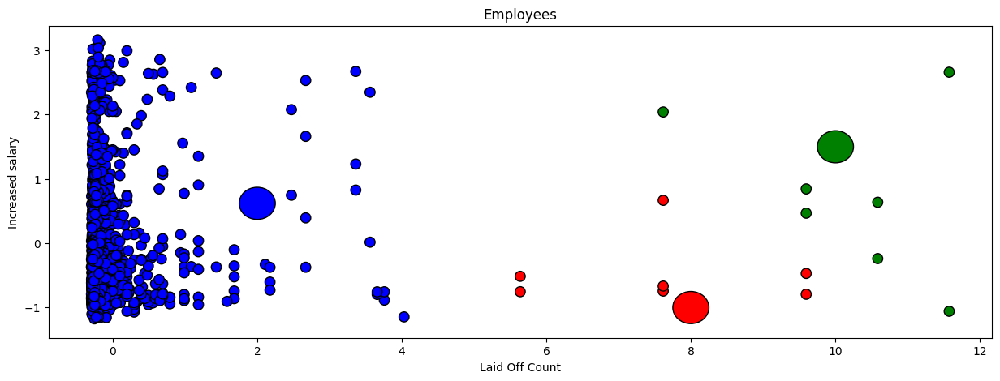

In [ ]:
fig = plt.figure(figsize=(15,5))

# Create a colormap
colormap = np.array(['black', 'blue', 'red', 'green'])

plt.scatter(Emp_scaled.Laid_Off_Count, Emp_scaled.increased_salary,
            c=colormap[Emp_scaled.Association], edgecolor = 'black', s = 80)
plt.title('Employees')
plt.xlabel('Laid Off Count')
plt.ylabel('Increased salary')
circle1 = plt.Circle(centroid1, radius=0.25, fc='blue', edgecolor = 'black')
circle2 = plt.Circle(centroid2, radius=0.25, fc='red', edgecolor = 'black')
circle3 = plt.Circle(centroid3, radius=0.25, fc='green', edgecolor = 'black')
plt.gca().add_patch(circle1)
plt.gca().add_patch(circle2)
plt.gca().add_patch(circle3)

* Displaying the data points associated to the respective
clusters 1, 2 and 3.
* Then calculating the mean of the clustered data to place the centroids for the 2nd iteration.
* Plot the graph to see how the centroid's positions have changed visually.
* Calculate teh distance of the data points to associate the data points to the closest cluster.
* Plot the graph to visualize the relationships between the data points and clusters.



In [ ]:
#Display datapoints associated to cluster 1
Emp_scaled[Emp_scaled.Association == 1].head(2)

,Laid_Off_Count,increased_salary,Dist_C1,Dist_C2,Dist_C3,Association
0,0.024338,-0.154160,2.121925,8.020389,10.111878,1
1,-0.158685,-0.217357,2.315402,8.196137,10.302824,1


In [ ]:
#Display datapoints associated to cluster 2
Emp_scaled[Emp_scaled.Association == 2].head(2)

,Laid_Off_Count,increased_salary,Dist_C1,Dist_C2,Dist_C3,Association
12,5.638675,-0.753463,3.889262,2.37416,4.909099,2
54,9.595917,-0.468990,7.673582,1.68194,2.010026,2


In [ ]:
#Display datapoints associated to cluster 3
Emp_scaled[Emp_scaled.Association == 3].head(2)

,Laid_Off_Count,increased_salary,Dist_C1,Dist_C2,Dist_C3,Association
45,11.574538,2.658921,9.789228,5.115176,1.955062,3
228,9.595917,0.467456,7.597449,2.168036,1.108797,3


In [ ]:
#Calculate mean of to change the position of the Centroid of cluster 1
centroid1 = Emp_scaled[Emp_scaled.Association == 1][["Laid_Off_Count", "increased_salary"]].mean()
centroid1

Laid_Off_Count     -0.085474
increased_salary   -0.001428
dtype: float64

In [ ]:
#Calculate mean of to change the position of the Centroid of cluster 2
centroid2 = Emp_scaled[Emp_scaled.Association == 2][["Laid_Off_Count", "increased_salary"]].mean()
centroid2

Laid_Off_Count      7.617296
increased_salary   -0.467398
dtype: float64

In [ ]:
#Calculate mean of to change the position of the Centroid of cluster 3
centroid3 = Emp_scaled[Emp_scaled.Association == 3][["Laid_Off_Count", "increased_salary"]].mean()
centroid3

Laid_Off_Count      10.161238
increased_salary     0.764467
dtype: float64

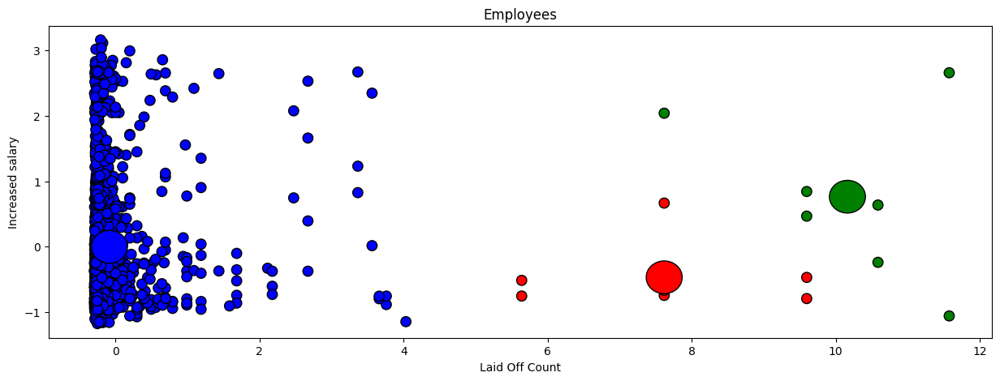

In [ ]:
fig = plt.figure(figsize=(15,5))

# Create a colormap
colormap = np.array(['black', 'blue', 'red', 'green'])

plt.scatter(Emp_scaled.Laid_Off_Count, Emp_scaled.increased_salary,
            c=colormap[Emp_scaled.Association], edgecolor = 'black', s = 80)
plt.title('Employees')
plt.xlabel('Laid Off Count')
plt.ylabel('Increased salary')
circle1 = plt.Circle(centroid1, radius=0.25, fc='blue', edgecolor = 'black')
circle2 = plt.Circle(centroid2, radius=0.25, fc='red', edgecolor = 'black')
circle3 = plt.Circle(centroid3, radius=0.25, fc='green', edgecolor = 'black')
plt.gca().add_patch(circle1)
plt.gca().add_patch(circle2)
plt.gca().add_patch(circle3)

In [ ]:
#Calculate the distance of the datapoints to place it to the closest cluster
Emp_scaled["Dist_C1"] = np.sqrt((Emp_scaled.Laid_Off_Count - centroid1[0])**2 + (Emp_scaled.increased_salary - centroid1[1])**2)
Emp_scaled["Dist_C2"] = np.sqrt((Emp_scaled.Laid_Off_Count - centroid2[0])**2 + (Emp_scaled.increased_salary - centroid2[1])**2)
Emp_scaled["Dist_C3"] = np.sqrt((Emp_scaled.Laid_Off_Count - centroid3[0])**2 + (Emp_scaled.increased_salary - centroid3[1])**2)
Emp_scaled["Association"] = np.where((Emp_scaled.Dist_C1 < Emp_scaled.Dist_C2) &
                                  (Emp_scaled.Dist_C1 < Emp_scaled.Dist_C3), 1,
                                   np.where((Emp_scaled.Dist_C2 < Emp_scaled.Dist_C1) &
                                  (Emp_scaled.Dist_C2 < Emp_scaled.Dist_C3) , 2, 3))
Emp_scaled.head(2)

,Laid_Off_Count,increased_salary,Dist_C1,Dist_C2,Dist_C3,Association
0,0.024338,-0.154160,0.188111,7.599417,10.178439,1
1,-0.158685,-0.217357,0.228002,7.780000,10.366522,1


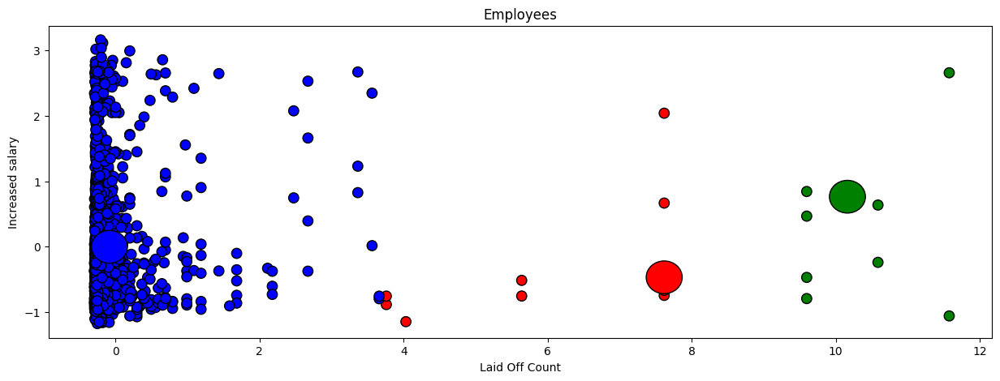

In [ ]:
fig = plt.figure(figsize=(15,5))

# Create a colormap
colormap = np.array(['black', 'blue', 'red', 'green'])

# Plot Sepal
plt.scatter(Emp_scaled.Laid_Off_Count, Emp_scaled.increased_salary, c=colormap[Emp_scaled.Association], edgecolor = 'black', s = 80)
plt.title('Employees')
plt.xlabel('Laid Off Count')
plt.ylabel('Increased salary')
circle1 = plt.Circle(centroid1, radius=0.25, edgecolor = 'black', fc='blue')
circle2 = plt.Circle(centroid2, radius=0.25, edgecolor = 'black', fc='red')
circle3 = plt.Circle(centroid3, radius=0.25, edgecolor = 'black', fc='green')
plt.gca().add_patch(circle1)
plt.gca().add_patch(circle2)
plt.gca().add_patch(circle3)

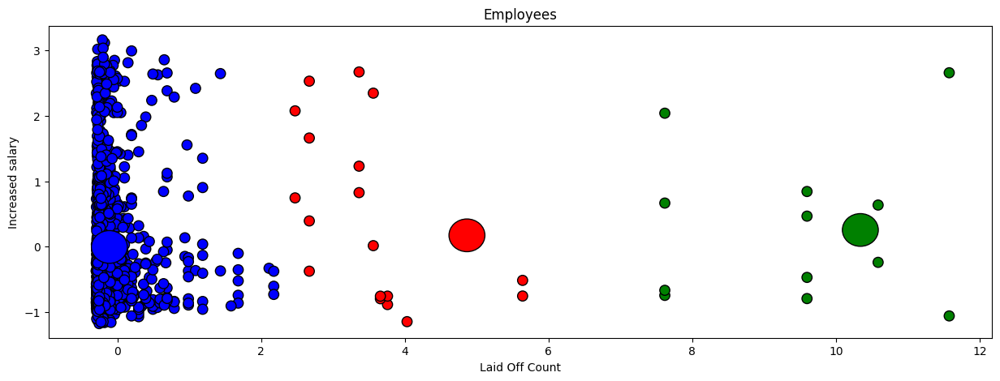

In [ ]:
centroid1 = Emp_scaled[Emp_scaled.Association == 1][["Laid_Off_Count", "increased_salary"]].mean()
centroid2 = Emp_scaled[Emp_scaled.Association == 2][["Laid_Off_Count", "increased_salary"]].mean()
centroid3 = Emp_scaled[Emp_scaled.Association == 3][["Laid_Off_Count", "increased_salary"]].mean()
Emp_scaled["Dist_C1"] = np.sqrt((Emp_scaled.Laid_Off_Count - centroid1[0])**2 + (Emp_scaled.increased_salary - centroid1[1])**2)
Emp_scaled["Dist_C2"] = np.sqrt((Emp_scaled.Laid_Off_Count - centroid2[0])**2 + (Emp_scaled.increased_salary - centroid2[1])**2)
Emp_scaled["Dist_C3"] = np.sqrt((Emp_scaled.Laid_Off_Count - centroid3[0])**2 + (Emp_scaled.increased_salary - centroid3[1])**2)
Emp_scaled["Association"] = np.where((Emp_scaled.Dist_C1 < Emp_scaled.Dist_C2) &
                                  (Emp_scaled.Dist_C1 < Emp_scaled.Dist_C3), 1,
                                   np.where((Emp_scaled.Dist_C2 < Emp_scaled.Dist_C1) &
                                  (Emp_scaled.Dist_C2 < Emp_scaled.Dist_C3) , 2, 3))
fig = plt.figure(figsize=(15,5))

# Create a colormap
colormap = np.array(['black', 'blue', 'red', 'green'])

# Plot Sepal
plt.scatter(Emp_scaled.Laid_Off_Count, Emp_scaled.increased_salary, c=colormap[Emp_scaled.Association], edgecolor = 'black', s = 80)
plt.title('Employees')
plt.xlabel('Laid Off Count')
plt.ylabel('Increased salary')
circle1 = plt.Circle(centroid1, radius=0.25, edgecolor = 'black', fc='blue')
circle2 = plt.Circle(centroid2, radius=0.25, edgecolor = 'black', fc='red')
circle3 = plt.Circle(centroid3, radius=0.25, edgecolor = 'black', fc='green')
plt.gca().add_patch(circle1)
plt.gca().add_patch(circle2)
plt.gca().add_patch(circle3)

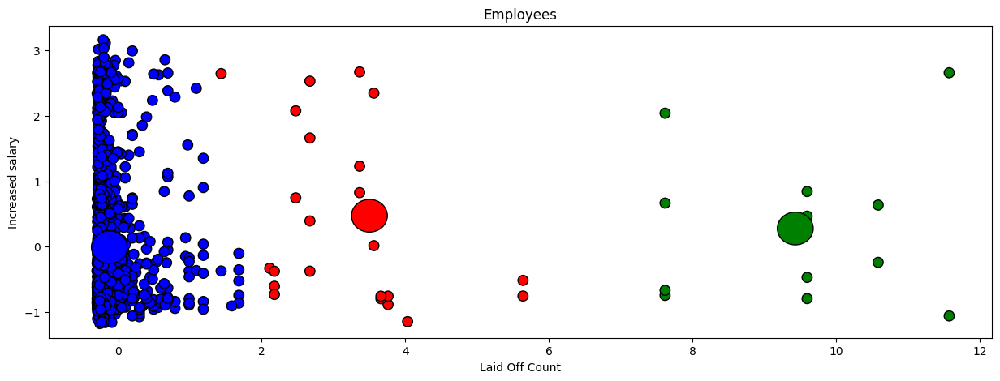

In [ ]:
centroid1 = Emp_scaled[Emp_scaled.Association == 1][["Laid_Off_Count", "increased_salary"]].mean()
centroid2 = Emp_scaled[Emp_scaled.Association == 2][["Laid_Off_Count", "increased_salary"]].mean()
centroid3 = Emp_scaled[Emp_scaled.Association == 3][["Laid_Off_Count", "increased_salary"]].mean()
Emp_scaled["Dist_C1"] = np.sqrt((Emp_scaled.Laid_Off_Count - centroid1[0])**2 + (Emp_scaled.increased_salary - centroid1[1])**2)
Emp_scaled["Dist_C2"] = np.sqrt((Emp_scaled.Laid_Off_Count - centroid2[0])**2 + (Emp_scaled.increased_salary - centroid2[1])**2)
Emp_scaled["Dist_C3"] = np.sqrt((Emp_scaled.Laid_Off_Count - centroid3[0])**2 + (Emp_scaled.increased_salary - centroid3[1])**2)
Emp_scaled["Association"] = np.where((Emp_scaled.Dist_C1 < Emp_scaled.Dist_C2) &
                                  (Emp_scaled.Dist_C1 < Emp_scaled.Dist_C3), 1,
                                   np.where((Emp_scaled.Dist_C2 < Emp_scaled.Dist_C1) &
                                  (Emp_scaled.Dist_C2 < Emp_scaled.Dist_C3) , 2, 3))
fig = plt.figure(figsize=(15,5))

# Create a colormap
colormap = np.array(['black', 'blue', 'red', 'green'])

# Plot Sepal
plt.scatter(Emp_scaled.Laid_Off_Count, Emp_scaled.increased_salary, c=colormap[Emp_scaled.Association], edgecolor = 'black', s = 80)
plt.title('Employees')
plt.xlabel('Laid Off Count')
plt.ylabel('Increased salary')
circle1 = plt.Circle(centroid1, radius=0.25, edgecolor = 'black', fc='blue')
circle2 = plt.Circle(centroid2, radius=0.25, edgecolor = 'black', fc='red')
circle3 = plt.Circle(centroid3, radius=0.25, edgecolor = 'black', fc='green')
plt.gca().add_patch(circle1)
plt.gca().add_patch(circle2)
plt.gca().add_patch(circle3)

* Once, the final clustering is performed, i.e. until a stopping criterion is met such as reaching a certain number of iterations or the centroids staying the same.
* Below is the Dendrogram plotted to see how the clustering is formed visually.
* We can see the 5 clusters are formed and is represented in the form of Purple, Red, Blue, Green and Orange color.
* Since no threshold has been established, we can infer from the colors that the data is separated into five clusters in Dendrogram.





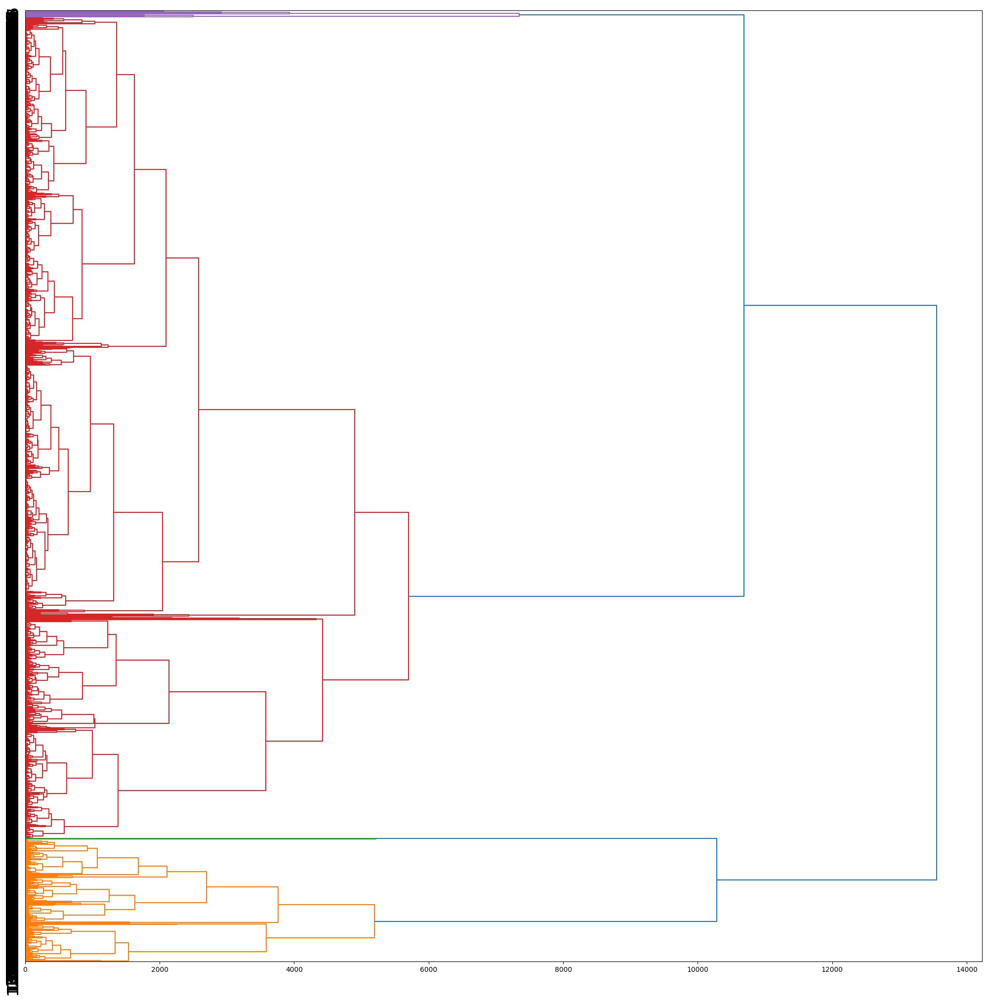

In [ ]:
#Plot a Dendrogram
data_frame = emp[['Laid_Off_Count', 'increased_salary']]
Z = linkage(data_frame, 'average')
plt.figure(figsize=(25, 25))
D = dendrogram(Z, orientation="right", leaf_font_size=23, leaf_rotation=90,labels = data_frame.index)

##**9. K-means using Sklearn()** -

K-means clustering is a common machine learning technique used in business and data analysis to group data points into clusters. In this case, the data points represent employees, in this case the features are "Laid Off Count" and "Increased Salary" and the goal is to group them into clusters based on their characteristics.

K is basically the number of Centroids or Clusters we want to form.

Each data point is colored according to its assigned cluster, helping us to visualize the groupings of employees data based on attributes such as 'Laid_Off_Count' and 'increased_salary.'

The generated clusters are then presented to offer business insights into employee groupings that might guide different HR and management decisions.





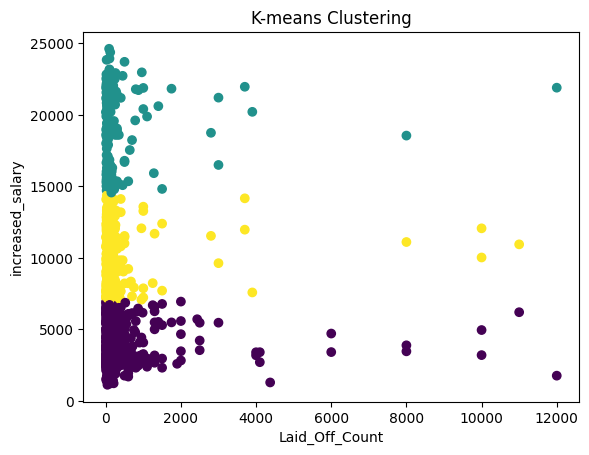

In [ ]:
 def kmeans(emp, k, max_iters=100):
    Centroids = emp.values[np.random.choice(emp.shape[0], k, replace=False)]

    for _ in range(max_iters):
        distances = np.linalg.norm(emp.values[:, np.newaxis] - Centroids, axis=2)
        labels = np.argmin(distances, axis=1)

        New_Centroids = np.array([emp.values[labels == i].mean(axis=0) for i in range(k)])

        if np.all(Centroids == New_Centroids):
            break

        Centroids = New_Centroids

    return labels
if __name__ == "__main__":
    data_frame = emp[['Laid_Off_Count', 'increased_salary']]
    k = 3
    model = kmeans(data_frame, k)

    if len(model) == data_frame.shape[0]:
        plt.scatter(data_frame['Laid_Off_Count'], data_frame['increased_salary'], c=model, cmap='viridis')
        plt.title("K-means Clustering")
        plt.xlabel("Laid_Off_Count")
        plt.ylabel("increased_salary")
        plt.show()
    else:
        print("Mismatch between the number of clusters and data points.")

# **<u>10.Supervised Clustering (KNN Function)</u> :-**

* The k-Nearest Neighbors (kNN) algorithm to predict the class based on features, here we are predicting the Education level of an employee based on increased salary and laid off count.

* Employees with similar characteristics are likely to make similar decisions.

* The kNN algorithm represents the number of nearest neighbors to consider when making a prediction which means the number of employees to consider when predicting employees education level.

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
import warnings

In [ ]:
def predictKNN(k, data_point, dataframe):
    # Extract the features (X) and labels (Y) from the dataframe
    X = dataframe.iloc[:, :-1]  # Assuming the last column is the classification target
    Y = dataframe.iloc[:, -1]

    # Create and fit the kNN classifier
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X, Y)

    # Predict the class label for the given data point
    predicted_class = knn.predict([data_point])

    return predicted_class[0]

In [ ]:
Knn_df = Emp_layoff[['Laid_Off_Count', 'increased_salary', 'Education_Level']].astype(int)

The below section predicts the education level of the employee for five different data points.


In [ ]:
data_point1 = [2100, 5400]  # Modify the data points to match your actual data
data_point2 = [9800, 10200]
data_point3 = [11000, 22000]
data_point4 = [10000, 2000]
data_point5 = [1000, 2200]
warnings.filterwarnings("ignore")
# Use the predictKNN function with different data points
predicted_class1 = predictKNN(3, data_point1, Knn_df)
predicted_class2 = predictKNN(3, data_point2, Knn_df)
predicted_class3 = predictKNN(3, data_point3, Knn_df)
predicted_class4 = predictKNN(3, data_point4, Knn_df)
predicted_class5 = predictKNN(3, data_point5, Knn_df)

print("Predicted Education level for data_point1:", predicted_class1)
print("Predicted Education level for data_point2:", predicted_class2)
print("Predicted Education level for data_point3:", predicted_class3)
print("Predicted Education level for data_point3:", predicted_class4)
print("Predicted Education level for data_point3:", predicted_class5)

Predicted Education level for data_point1: 4
Predicted Education level for data_point2: 3
Predicted Education level for data_point3: 2
Predicted Education level for data_point3: 2
Predicted Education level for data_point3: 3


* The x-axis is labeled as 'Laid_Off_Count,' and the y-axis is labeled as 'increased_salary.' These labels provide context for what the axes represent.

* It helps to visualize how different education levels relate to 'Laid_Off_Count' and 'increased_salary' within an organization. Each data point represents an individual employee, and the color indicates their education level.

* It could help in identifying trends such as whether higher education levels are associated with increased salaries or different levels of job security.

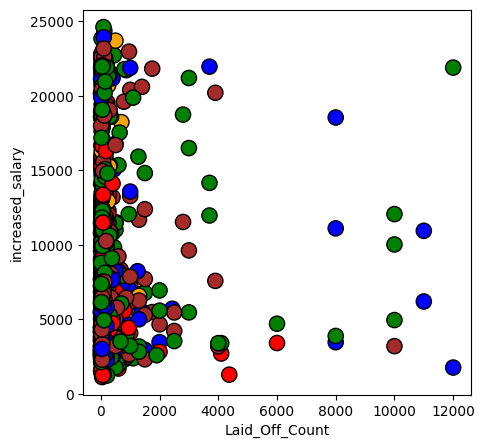

In [ ]:
color_mapping = {
    1: 'red',
    2: 'blue',
    3: 'green',
    4: 'brown',
    5: 'orange'
    # Add more job roles and corresponding colors as needed
}

fig, ax = plt.subplots(figsize=(5, 5))
scatter = ax.scatter(Knn_df['Laid_Off_Count'], Knn_df['increased_salary'],
                     c=[color_mapping.get(job_role, 'black') for job_role in Knn_df['Education_Level']],
                     edgecolor='black', s=120)

ax.set_xlabel('Laid_Off_Count')
ax.set_ylabel('increased_salary')

plt.show()


In [ ]:
knn = KNeighborsClassifier(n_neighbors = 4,
                           p = 2)# p=2 for euclidean distance
knn.fit(Knn_df[["Laid_Off_Count", "increased_salary"]], Knn_df.Education_Level)

KNeighborsClassifier(n_neighbors=4)

* This mesh grid covers the range of possible values for 'Laid_Off_Count' (x-axis) and 'increased_salary' (y-axis) within specified ranges.
* The KNN regression model is applied to predict values for each point on the mesh grid.
* This visualization can be valuable for understanding how employee characteristics, such as layoff history and salary increases, relate to their education levels.
* It can help identify trends, patterns, and potential decision boundaries for categorizing employees into different education levels.
* It might show that certain combinations of 'Laid_Off_Count' and 'increased_salary' are associated with higher or lower education levels.

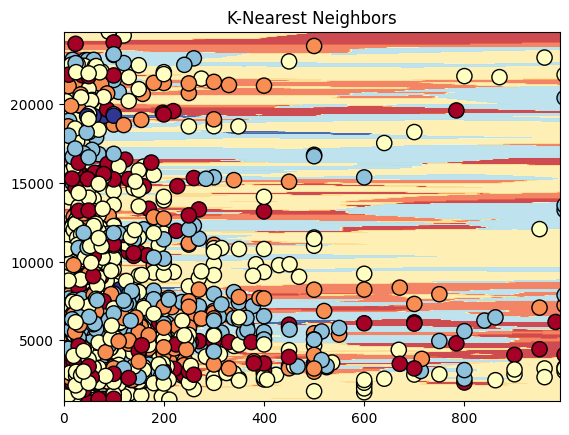

In [ ]:
from sklearn.neighbors import KNeighborsRegressor
def plotmesh():
  # Set the step size for the mesh grid
  h = 10  # You can adjust this step size as needed

  # Change the x-axis range to 0 to 1000
  x_min, x_max = 0, 1000
  y_min, y_max = Knn_df.increased_salary.min() - 1, Knn_df.increased_salary.max() + 1
  xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))

  # Predict the values using the K-nearest neighbors regression model
  Z = knn.predict(np.c_[xx.ravel(), yy.ravel()])
  Z = Z.reshape(xx.shape)

  # Plot the mesh
  plt.contourf(xx, yy, Z, cmap=plt.cm.RdYlBu, alpha=0.8)

  # Plot the data points with the same color as the cluster mesh
  predicted_education = knn.predict(Knn_df[["Laid_Off_Count", "increased_salary"]])
  plt.scatter(Knn_df.Laid_Off_Count, Knn_df.increased_salary, c=predicted_education, cmap=plt.cm.RdYlBu, edgecolor='black', s=120)
  plt.xlim(xx.min(), xx.max())
  plt.ylim(yy.min(), yy.max())
  plt.title("K-Nearest Neighbors")

  # Show the plot
  plt.show()

plotmesh()

* It uses the input values "Laid_off_Count" and "Increased_Salary" of Employee to predict an "Education Level" for the given feature values.
* It helps to  classify or categorize employees based on their salary, which might be useful for customized training, or decision-making.
* This also ensures that the model incorporates the most recent data for future predictions.
* This plot provides a visual representation of how the model's predictions change with the addition of new data points.

Laid Off Count: 10
increased salary: 190989
Prediction: Education Level # 3 Blue


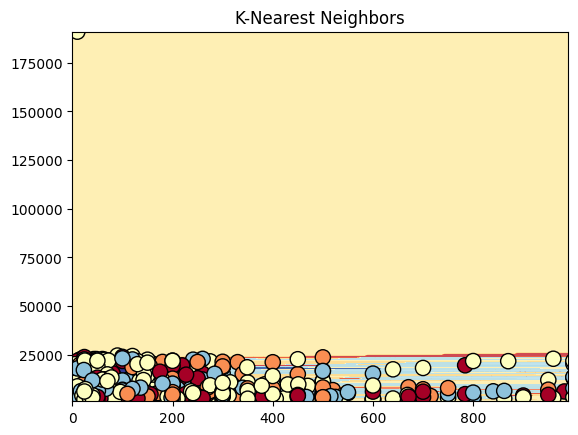

In [ ]:
# make prediction
warnings.filterwarnings("ignore")
Laid_Off_Count = int(input('Laid Off Count: '))
increased_salary = int(input('increased salary: '))
data_class = knn.predict(np.array([Laid_Off_Count, increased_salary]).reshape(1, -1))[0]
class_name = ["N/A", "Yellow", "Red", "Blue", "Green"]

print('Prediction: Education Level #', data_class, class_name[data_class])

Knn_df.loc[len(Knn_df)]=[Laid_Off_Count, increased_salary, data_class]
knn.fit(Knn_df[["Laid_Off_Count", "increased_salary"]], Knn_df.Education_Level)
plotmesh()

##11. <u>**Project Report**</u> :

The influence of layoffs on employee attrition within a company is analyzed in this research. Finding trends in employee attrition using clustering analysis will help us comprehend how layoffs have impacted employee turnover.  The objective of the findings is to offer management and HR with information to help them make wise decisions.

**Data Preparation, Gathering and Exploration** -

* The dataset was gathered from the various sites such as  Kaggle, Github and combined the dataset to be used for analysis, it contains employee-related information, including attrition rates, performance metrics, tenure, overtime and other relevant attributes.
* Preprocessing of collected data included data cleansing, addressing missing responses, and encoding categorical variables. * This made certain that the dataset was ready for the analysis.
* To obtain more insights on Employee Attrition, checked for the dimensions, shape and summary of the data.
* Calculated the average salary, increased salary  and promotion status and created three new columns in the dataset.

**Data Visualization**

We have created multiple distinct graphs to get deeper insights and graphical representation of the data and their values where -

1. Scatter Plot - This illustrates the general pattern of the number of layoffs according to the companies.
2. Pie chart - This graphic displays the total percentage of layoffs by gender.
3. Correlation Graph - This graph indicates which attributes have a strong correlation and which do not. It is clear that the following attributes have a strong correlation: employee job level, salary, performance rating, experience, and years at company.
4. Pair Plot: This shows how attributes like employee age, salary, education level, performance rating, and employee hike percentage relate to one another pairwise.
5. Joint Plots: Based on an employee's age, it displays the trend of their over time.
Furthermore, the other joint depicts the overtime trend according to employee experience.

**Cluster Analysis**

* Agglomerative hierarchical clustering was used to segment employees into distinct clusters based on attributes related to Age, performance, and Salary.
* The optimal number of clusters (k) was determined by calculating the euclidean distance between the datapoint and the clusters.
* The features selected for clustering included Age, performance, and Salary.
* The clusters can be is demonstrated visually by plotting a Dendrogram.
* It can be used to identify high-performing teams within the organization.
* It can help in segmenting employees for targeted training or development programs.
* It may assist in understanding patterns related to attrition and employee retention based on the Age and Experience.
* Cluster labels are assigned to each employee in the dataset is based on the hierarchical structure.
* Silhouette Score Plot is created to measure the quality of the clusters, here the plot give the (0.48 score) which is close to 1 which gives the best number of clusters for the data.

<u>Cluster 1</u> - High Salary, High Performance
This cluster consists of employees with high Salary and high performance metrics.
Employees in this cluster tend to have longer tenure and are considered stable and valuable assets to the organization.

<u>Cluster 2</u> - Moderate Salary, Moderate Performance
This cluster includes employees with moderate Salary and performance metrics.
Employees in this cluster exhibit a balanced profile in terms of Salary and performance.

<u>Cluster 3</u> - Low Salary, Low Performance
This cluster comprises employees with low Salary and low performance metrics.
Employees in this cluster are at a higher risk of attrition and may require additional attention.

**Unsupervised Clustering**

Using both the approaches, we obtained the same number of clusters which is minimum number of possible groups i.e. <u>3 clusters</u> are formed based on the Employee Salary, Age, and Performance.

1. <u>K-means with Random Starting Points</u>:

* This method starts the K-means clustering algorithm with a random selection of K centroids, where K is the number of clusters that are wanted.
* These original centroids are where the clustering process begins.
* Here, we have grouped employees based on their performance, increased Salary and Laid off count.
* Effective for locating compact, evenly spaced clusters.
* However, struggles with unevenly sized clusters.

2. <u>Using the K-means Approach</u>:

* Data points are divided into K clusters using an iterative process called K-means clustering.
* K-means begins with centroids based on the initial selection of data points, unlike random centroid initialization, and these are then optimized during the clustering process.
* Clustered the same features performance, increased Salary and Laid off count with different approach.
* It can handle different shapes and sizes of clusters.
* Although, requires careful selection of the number of clusters
(K).

**Supervised Clustering**

* Understanding the factors that contribute to attrition and being able to predict which employees are at risk of leaving can be achieved by Supervised clustering using the KNN algorithm  can help address this challenge.

* The labelling of the Employees is done based on the laid off count and the increased salary.

* The visualization depicts that if the increased salary is high and the laid off count of an organization is less then the education level of an employee is high.

A visual representation of how the KNN model is created that makes predictions and which can assist businesses in making informed decisions based on employee data and education level predictions.




*  **Scatter Plot** -

This scatter plot represents the employee hike percentage according to their level of employment.

With this plot, it is clear that the more the employee's experience, the higher the percentage of the hike.

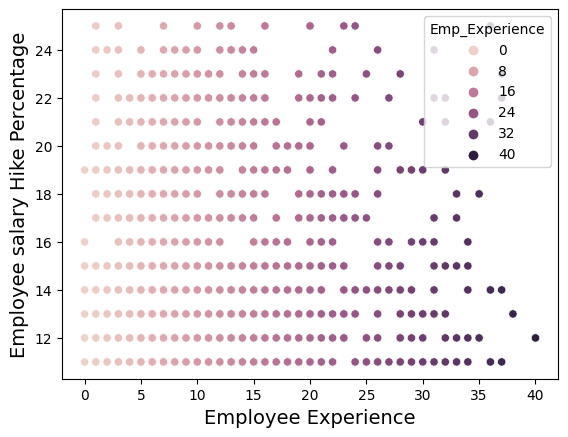

In [ ]:
p = sns.scatterplot(data=Emp_layoff, x='Emp_Experience', y='Emp_Salary_Hike_Per', hue='Emp_Experience')
p.set_xlabel('Employee Experience', fontsize=14)
p.set_ylabel('Employee salary Hike Percentage', fontsize=14)
plt.show()

* **Pie Chart** -

This graph gives the brief look of the Genderwise distribution of the laid off employees.

This plot states that the percentage of the Female employee laid off is 40% whereas the percentage of the Male employee laid off is much higher i.e. 60%.

In [ ]:
count_gender_layoffs = Emp_layoff['Emp_Gender'].value_counts()
count_gender_layoffs

Male      882
Female    588
Name: Emp_Gender, dtype: int64

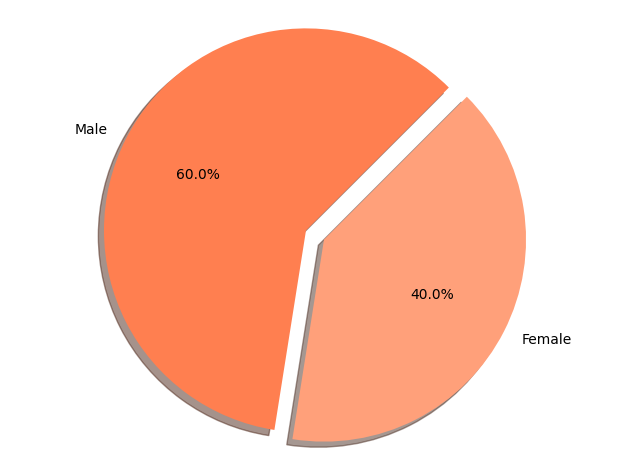

In [ ]:
gender_labels = count_gender_layoffs.index
percentages = count_gender_layoffs.values
colors = ['Coral', 'LightSalmon']
explode = [0.1 if gender_labels == 'Male' else 0 for gender_labels in gender_labels]
fig1, ax1 = plt.subplots()
ax1.pie(percentages, labels=gender_labels,colors=colors,explode=explode, autopct='%1.1f%%',
        shadow=True, startangle=45)
ax1.axis('equal')
plt.tight_layout()
plt.show()

**Recommendation**

The analysis leads to the following suggestions being made:

Monitor Cluster 3: It's critical to keep a close eye on and provide support to workers in this cluster due to the increased attrition rate among underperforming and low-paid employees following layoffs.

Retention Strategies: Create and put into action focused retention strategies for Cluster 3, such as mentorship initiatives and plans for performance enhancement.

Layoff Impact Assessment: Evaluate the effects of layoffs on employee attrition on a regular basis and modify your layoff plans as necessary.

Employee Engagement: To lower the risk of attrition and retain high-performing staff, improve employee engagement and communication.



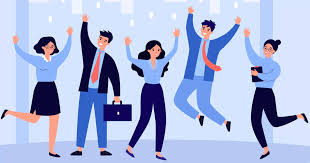

**References**
* Zybooks
* https://www.analyticsvidhya.com/
* Chatgpt
